In [21]:
import os, numpy as np, matplotlib.pyplot as plt, pandas as pd
from PIL import Image

# Пути
OUT_DIR = "lab1_outputs"
os.makedirs(OUT_DIR, exist_ok=True)
IMG_PATH = "data/image_v1-15.png"

try:
    from skimage import exposure, color
    SKIMAGE_OK = True
except Exception:
    SKIMAGE_OK = False

# Утилиты
def rgb_to_gray709(img_rgb):
    g = (0.2126*img_rgb[...,0] + 0.7152*img_rgb[...,1] + 0.0722*img_rgb[...,2]).astype(np.float32)
    return np.clip(g,0,255).astype(np.uint8)

def show(im, title=None, cmap=None, fname=None, size=(7,5)):
    plt.figure(figsize=size)
    if im.ndim == 2: plt.imshow(im, cmap=cmap or "gray")
    else:            plt.imshow(im)
    plt.axis("off")
    if title: plt.title(title)
    if fname: plt.savefig(os.path.join(OUT_DIR, fname), bbox_inches="tight")
    plt.show()

def image_hist(img_u8):
    hist, _ = np.histogram(img_u8.ravel(), bins=256, range=(0,256))
    cdf = hist.cumsum().astype(np.float64); cdf /= cdf[-1]
    return hist, cdf

def glcm_contrast(img_u8, dx, dy, levels=256):
    I = img_u8.astype(np.int32); h, w = I.shape
    x0 = max(dx,0); x1 = w + min(dx,0)
    y0 = max(dy,0); y1 = h + min(dy,0)
    A = I[y0:y1, x0:x1]
    B = I[y0-dy:y1-dy, x0-dx:x1-dx]
    pairs = A*levels + B
    counts = np.bincount(pairs.ravel(), minlength=levels*levels)
    G = counts.reshape((levels,levels)).astype(np.float64)
    if G.sum()==0: return G, 0.0
    P = G/G.sum()
    i = np.arange(levels).reshape(-1,1); j = np.arange(levels).reshape(1,-1)
    return G, float(((i-j)**2 * P).sum())

def dynamic_range(x): return int(x.max())-int(x.min())
def rms_contrast(x):  return float(x.astype(np.float32).std())
def entropy_bits(x):
    h,_ = np.histogram(x.ravel(), bins=256, range=(0,256))
    p = h/ max(1,h.sum()); p = p[p>0]
    return float(-(p*np.log2(p)).sum())

def stretch_0_255(img):
    a, b = int(img.min()), int(img.max())
    if b==a: return np.zeros_like(img, dtype=np.uint8)
    y = (img.astype(np.float32)-a)/(b-a)*255.0
    return np.clip(y,0,255).astype(np.uint8)

def window_contrast(img, wmin, wmax):
    x = img.astype(np.float32); y = np.zeros_like(x)
    y[x<=wmin] = 0
    mid = (x>wmin)&(x<wmax)
    y[mid] = (x[mid]-wmin)/max(1e-6,(wmax-wmin))*255.0
    y[x>=wmax] = 255
    return np.clip(y,0,255).astype(np.uint8)

def gamma_correct(img, gamma):
    x = (img.astype(np.float32)/255.0)**gamma
    return np.clip(x*255.0,0,255).astype(np.uint8)

def match_to_pdf(img, pdf):
    pdf = np.maximum(np.asarray(pdf, float), 0); pdf = pdf/pdf.sum()
    target_cdf = np.cumsum(pdf)
    hist,_ = np.histogram(img.ravel(), bins=256, range=(0,256))
    src_cdf = np.cumsum(hist).astype(float); src_cdf /= src_cdf[-1]
    lut = np.searchsorted(target_cdf, src_cdf, side="left")
    lut = np.clip(lut,0,255).astype(np.uint8)
    return lut[img]

def ahe_like(img, grid=(8,8), clip_limit=1.0):
	h,w = img.shape
	ky = max(2, h//grid[0]); kx = max(2, w//grid[1])
	eq = exposure.equalize_adapthist(img, kernel_size=(ky,kx), clip_limit=clip_limit, nbins=256)
	return np.clip(eq*255.0,0,255).astype(np.uint8)


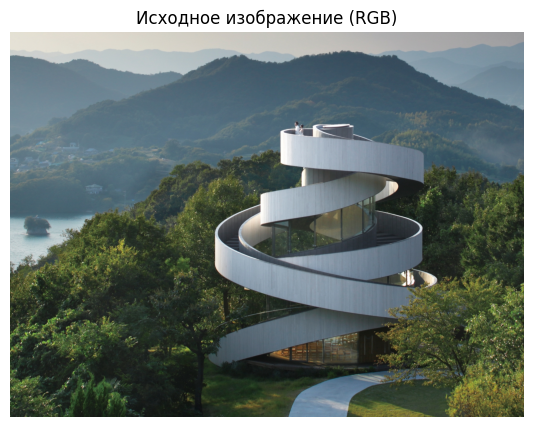

In [22]:
rgb = np.array(Image.open(IMG_PATH).convert("RGB"))
H, W, C = rgb.shape
show(rgb, "Исходное изображение (RGB)", fname="01_rgb.png")

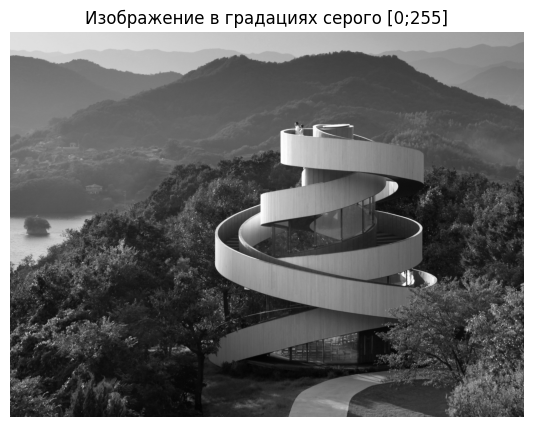

In [23]:
gray = rgb_to_gray709(rgb)
show(gray, "Изображение в градациях серого [0;255]", cmap="gray", fname="02_gray.png")

,Возможный диапазон яркостей,Динамический диапазон,% использования яркостного диапазона,Число различных яркостей,Средняя яркость,Дисперсия яркости,Контраст Михельсона,Глобальный контраст,Среднеквадратический контраст
0,[0; 255],243,95.294118,244,95.001962,2380.726539,0.910112,0.952941,48.792686


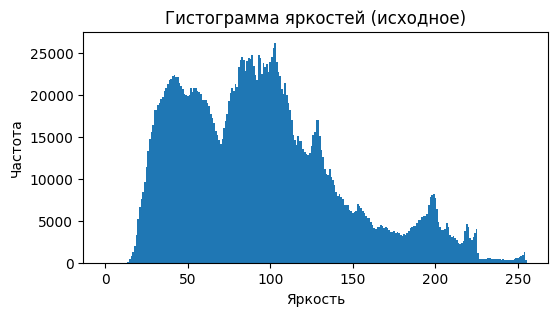

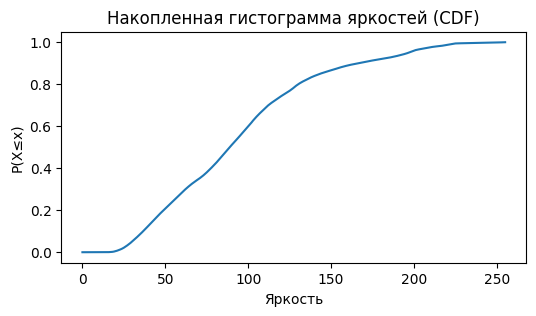

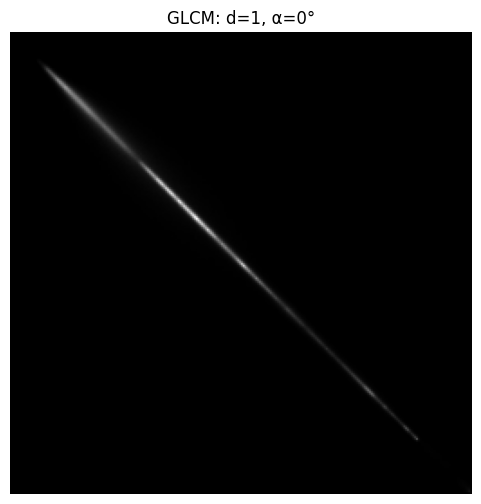

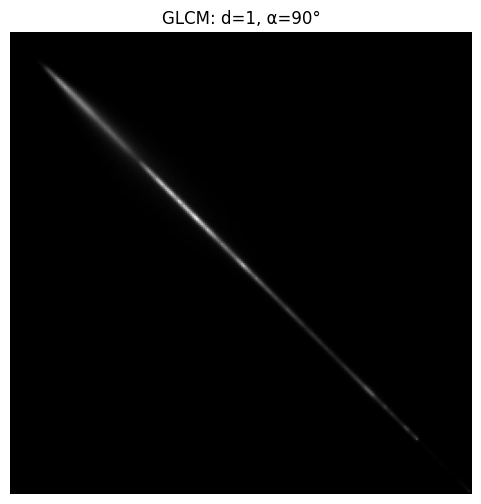

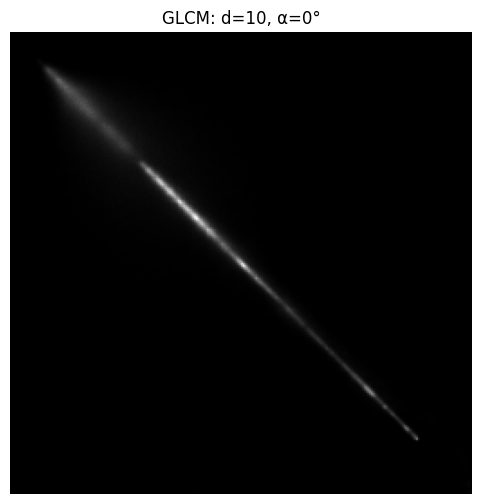

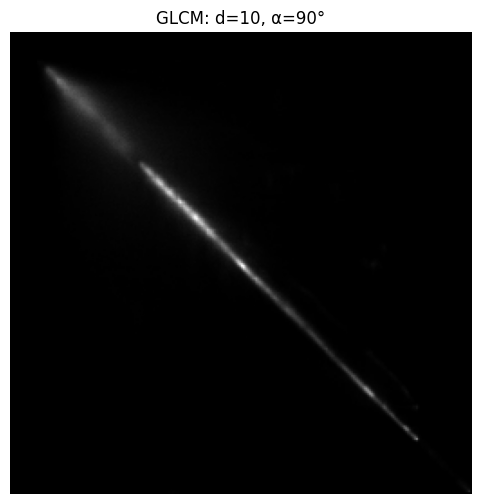

- Контраст Харалика (d=1): α=0°=62.66, α=90°=64.40, среднее=63.53.


In [24]:
P = 255
a_min, a_max = int(gray.min()), int(gray.max())
stats = {
    "Возможный диапазон яркостей": "[0; 255]",
    "Динамический диапазон": a_max - a_min,
    "% использования яркостного диапазона": (a_max-a_min)/P*100,
    "Число различных яркостей": int(np.unique(gray).size),
    "Средняя яркость": float(gray.mean()),
    "Дисперсия яркости": float(gray.var()),
    "Контраст Михельсона": (a_max-a_min)/(a_max+a_min) if (a_max+a_min)!=0 else np.nan,
    "Глобальный контраст": (a_max-a_min)/P,
    "Среднеквадратический контраст": rms_contrast(gray)
}
display(pd.DataFrame([stats]))

hist, cdf = image_hist(gray)
plt.figure(figsize=(6,3)); plt.bar(range(256), hist, width=1); plt.title("Гистограмма яркостей (исходное)"); plt.xlabel("Яркость"); plt.ylabel("Частота")
plt.savefig(os.path.join(OUT_DIR,"03_hist_src.png"), bbox_inches="tight"); plt.show()
plt.figure(figsize=(6,3)); plt.plot(range(256), cdf); plt.title("Накопленная гистограмма яркостей (CDF)"); plt.xlabel("Яркость"); plt.ylabel("P(X≤x)")
plt.savefig(os.path.join(OUT_DIR,"04_cdf_src.png"), bbox_inches="tight"); plt.show()

G_1_0, h_1_0 = glcm_contrast(gray,1,0)
G_1_90, h_1_90 = glcm_contrast(gray,0,1)
G_10_0, _ = glcm_contrast(gray,10,0)
G_10_90, _ = glcm_contrast(gray,0,10)

for M,ttl,fn in [(G_1_0,"GLCM: d=1, α=0°","05_glcm_d1_a0.png"),
                 (G_1_90,"GLCM: d=1, α=90°","06_glcm_d1_a90.png"),
                 (G_10_0,"GLCM: d=10, α=0°","07_glcm_d10_a0.png"),
                 (G_10_90,"GLCM: d=10, α=90°","08_glcm_d10_a90.png")]:
    show(M, ttl, cmap="gray", fname=fn, size=(6,6))

print(f"- Контраст Харалика (d=1): α=0°={h_1_0:.2f}, α=90°={h_1_90:.2f}, среднее={(h_1_0+h_1_90)/2:.2f}.")

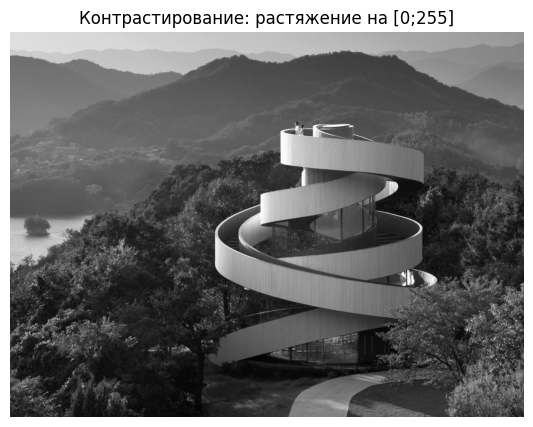

In [25]:
stretched = stretch_0_255(gray)
show(stretched, "Контрастирование: растяжение на [0;255]", cmap="gray", fname="10_stretch.png")
src = stretched.copy()

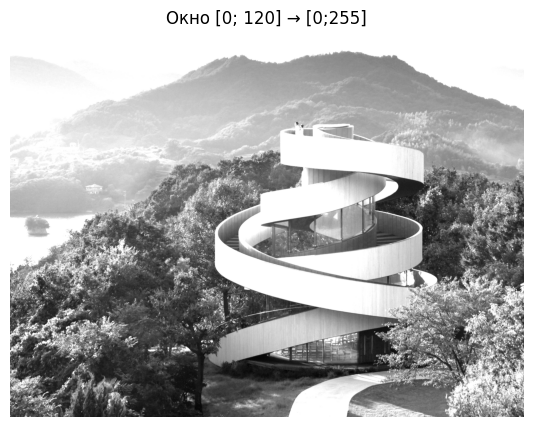

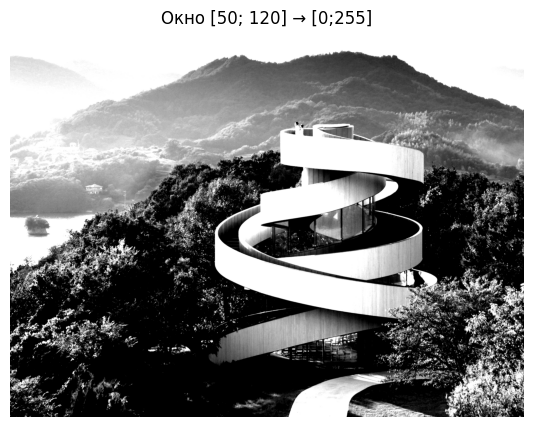

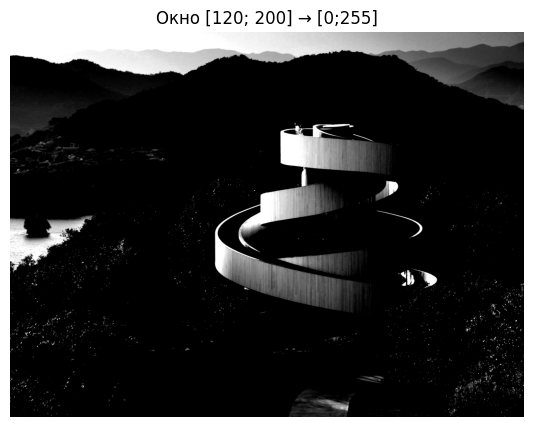

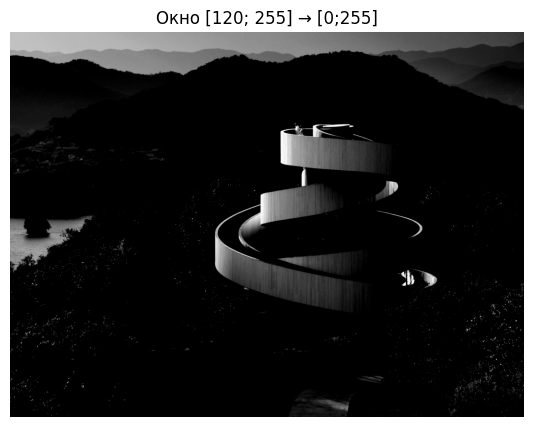

In [26]:
for wmin, wmax in [(0,120),(50,120),(120,200),(120,255)]:
    wimg = window_contrast(src, wmin, wmax)
    show(wimg, f"Окно [{wmin}; {wmax}] → [0;255]", cmap="gray", fname=f"11_window_{wmin}_{wmax}.png")

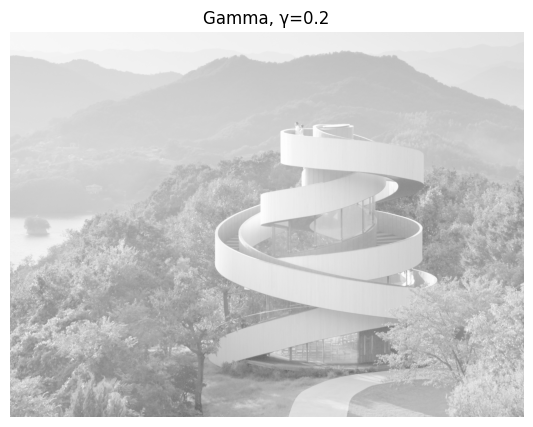

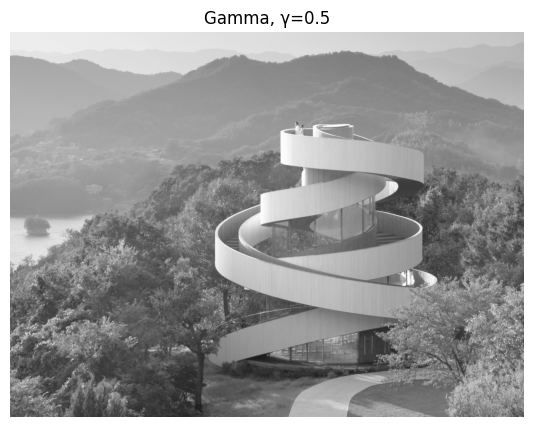

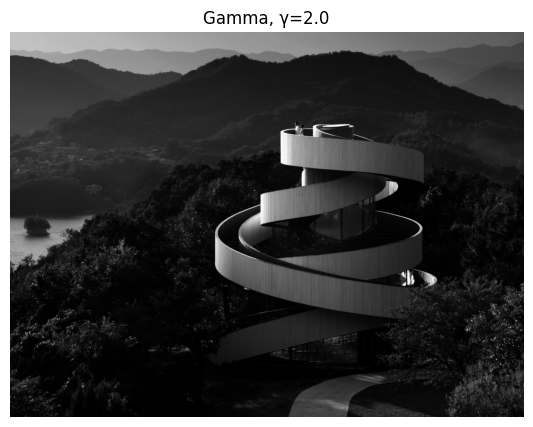

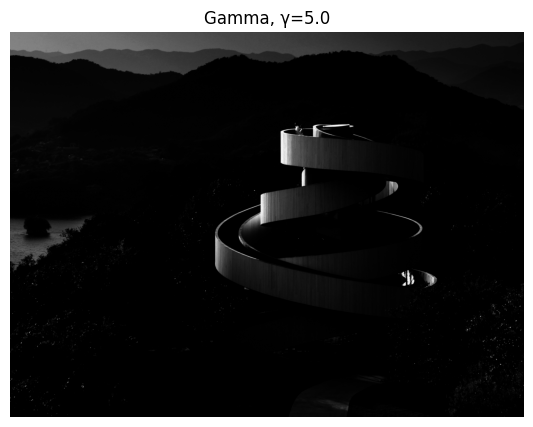

In [27]:
for g in [0.2, 0.5, 2.0, 5.0]:
    gimg = gamma_correct(src, g)
    show(gimg, f"Gamma, γ={g}", cmap="gray", fname=f"20_gamma_{str(g).replace('.','_')}.png")

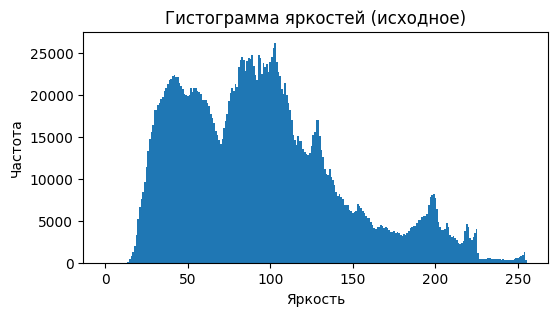

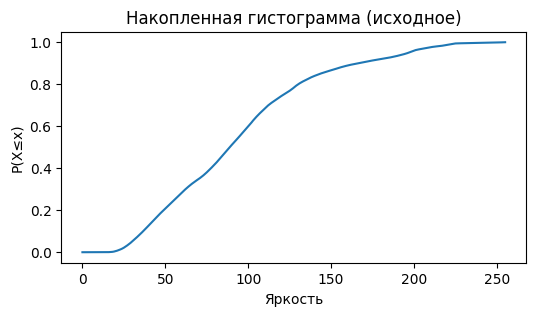

In [28]:
hist0, cdf0 = image_hist(gray)
plt.figure(figsize=(6,3)); plt.bar(range(256), hist0, width=1); plt.title("Гистограмма яркостей (исходное)"); plt.xlabel("Яркость"); plt.ylabel("Частота")
plt.savefig(os.path.join(OUT_DIR,"30_hist_src.png"), bbox_inches="tight"); plt.show()
plt.figure(figsize=(6,3)); plt.plot(range(256), cdf0); plt.title("Накопленная гистограмма (исходное)"); plt.xlabel("Яркость"); plt.ylabel("P(X≤x)")
plt.savefig(os.path.join(OUT_DIR,"31_cdf_src.png"), bbox_inches="tight"); plt.show()

In [29]:
import numpy as np

# Дискретные уровни яркости: a = 0..255
a = np.arange(256, dtype=np.int32)

# --- Равномерное ---
k_uniform = 1/256

# --- Симметричное треугольное (пик в центре) ---
k_tri = 1 / (127*128)

# --- Правое треугольное ---
k_right = 2 / (255*256)

# --- Левое треугольное ---
k_left = 2 / (255*256)

print("\nЧисленные значения k:")
print(f"  k (uniform)  = {k_uniform:.10f}")
print(f"  k (tri)      = {k_tri:.10f}")
print(f"  k (right)    = {k_right:.10f}")
print(f"  k (left)     = {k_left:.10f}")


Численные значения k:
  k (uniform)  = 0.0039062500
  k (tri)      = 0.0000615157
  k (right)    = 0.0000306373
  k (left)     = 0.0000306373


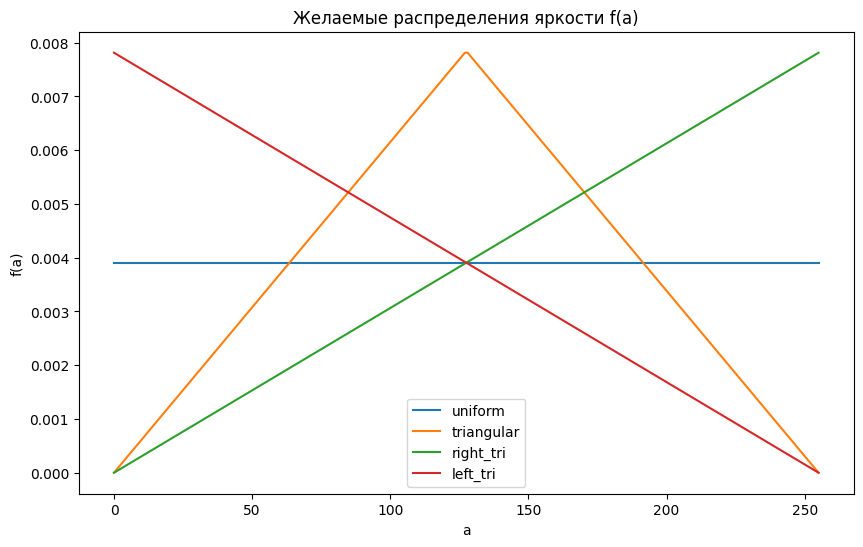

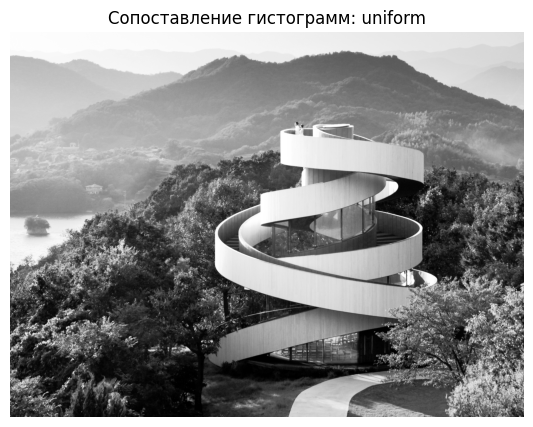

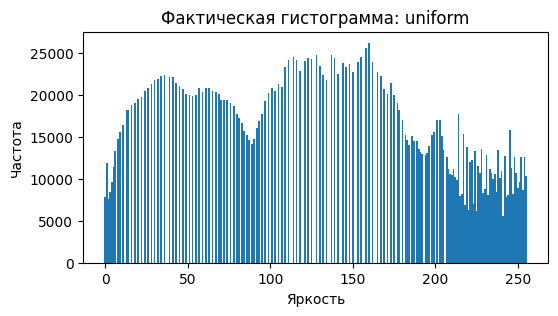

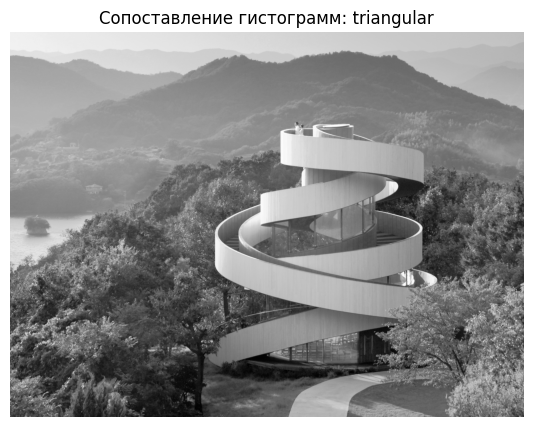

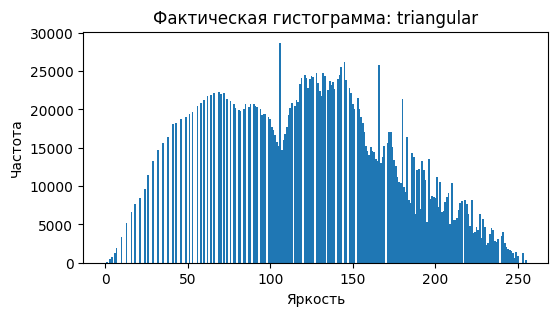

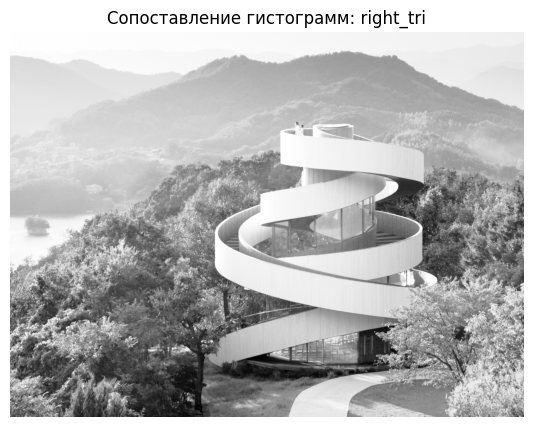

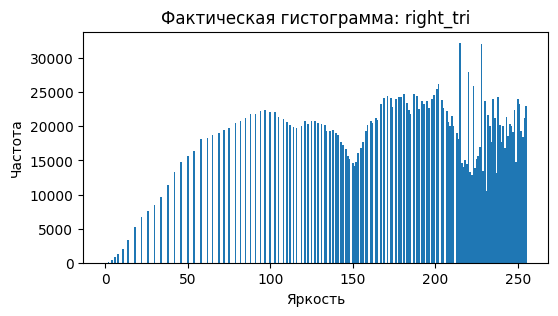

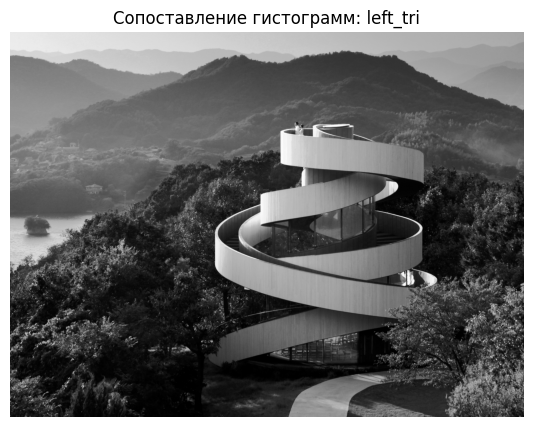

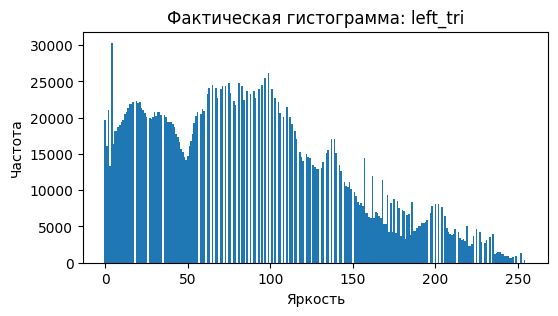

In [30]:
import numpy as np, matplotlib.pyplot as plt, os

try:
    src
except NameError:
    src = stretch_0_255(gray)

a = np.arange(256, dtype=np.int32)

# РАВНОМЕРНОЕ
pdf_uniform = np.full(256, 1/256, dtype=float)

# ТРЕУГОЛЬНОЕ (срединное)
k_tri = 1 / (127*128)
pdf_tri = np.zeros(256, float)
pdf_tri[:128]   = k_tri * a[:128]
pdf_tri[128:]   = k_tri * (255 - a[128:])

# ПРАВОЕ ТРЕУГОЛЬНОЕ
k_right = 2 / (255*256)
pdf_right = k_right * a

# ЛЕВОЕ ТРЕУГОЛЬНОЕ
k_left = 2 / (255*256)
pdf_left = k_left * (255 - a)

for name, pdf in [("uniform", pdf_uniform), ("triangular", pdf_tri), ("right_tri", pdf_right), ("left_tri", pdf_left)]:
    s = pdf.sum()
    if not np.isclose(s, 1.0, atol=1e-9):
        pdf /= s
        print(f"[warn] renormalized {name} to 1 (sum was {s})")

plt.figure(figsize=(10,6))
plt.plot(a, pdf_uniform, label="uniform")
plt.plot(a, pdf_tri, label="triangular")
plt.plot(a, pdf_right, label="right_tri")
plt.plot(a, pdf_left, label="left_tri")
plt.legend(); plt.title("Желаемые распределения яркости f(a)"); plt.xlabel("a"); plt.ylabel("f(a)")
plt.savefig(os.path.join(OUT_DIR, "39_target_pdfs.png"), bbox_inches="tight"); plt.show()

targets = {
    "uniform": pdf_uniform,
    "triangular": pdf_tri,
    "right_tri": pdf_right,
    "left_tri": pdf_left,
}

matched_exact = {}
for name, pdf in targets.items():
    mimg = match_to_pdf(src, pdf)
    matched_exact[name] = mimg
    show(mimg, f"Сопоставление гистограмм: {name}", cmap="gray", fname=f"40_match_{name}.png")
    h,_ = np.histogram(mimg.ravel(), bins=256, range=(0,256))
    plt.figure(figsize=(6,3)); plt.bar(range(256), h, width=1)
    plt.title(f"Фактическая гистограмма: {name}"); plt.xlabel("Яркость"); plt.ylabel("Частота")
    plt.savefig(os.path.join(OUT_DIR, f"41_hist_{name}.png"), bbox_inches="tight"); plt.show()

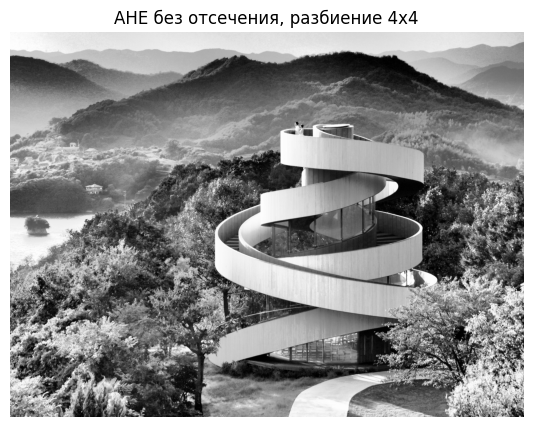

Для отчёта (4в): разбиение 4x4, размер окна ≈ 351×469 пикс.


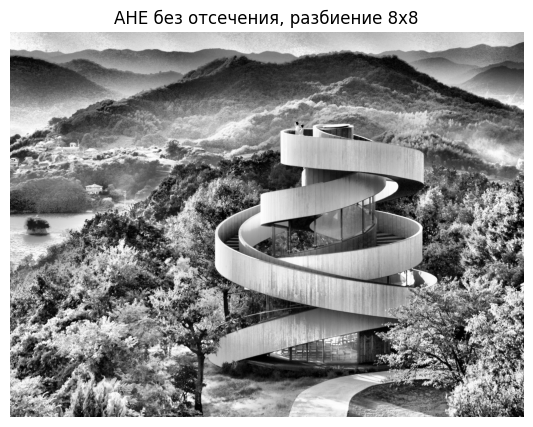

Для отчёта (4в): разбиение 8x8, размер окна ≈ 175×234 пикс.


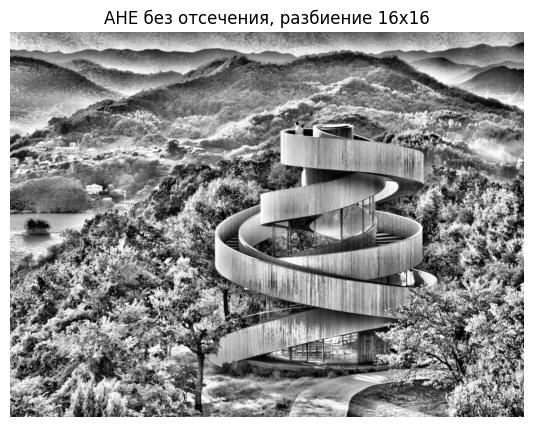

Для отчёта (4в): разбиение 16x16, размер окна ≈ 87×117 пикс.


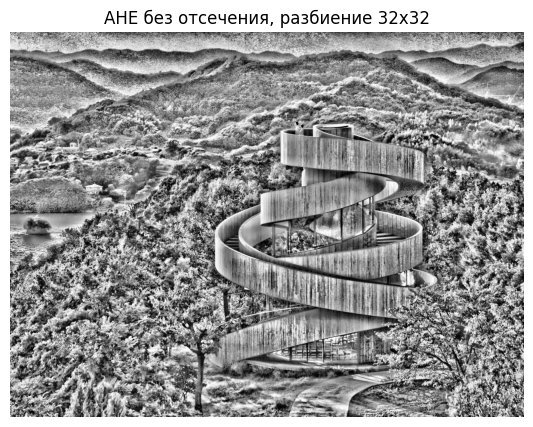

Для отчёта (4в): разбиение 32x32, размер окна ≈ 43×58 пикс.


In [31]:
H, W = src.shape
grids = [(4,4),(8,8),(16,16),(32,32)]
ahe_imgs = {}
for gy,gx in grids:
    im = ahe_like(src, grid=(gy,gx), clip_limit=1.0); ahe_imgs[(gy,gx)] = im
    win_h, win_w = H//gy, W//gx
    show(im, f"AHE без отсечения, разбиение {gy}x{gx}", cmap="gray", fname=f"50_ahe_{gy}x{gx}.png")
    print(f"Для отчёта (4в): разбиение {gy}x{gx}, размер окна ≈ {win_h}×{win_w} пикс.")

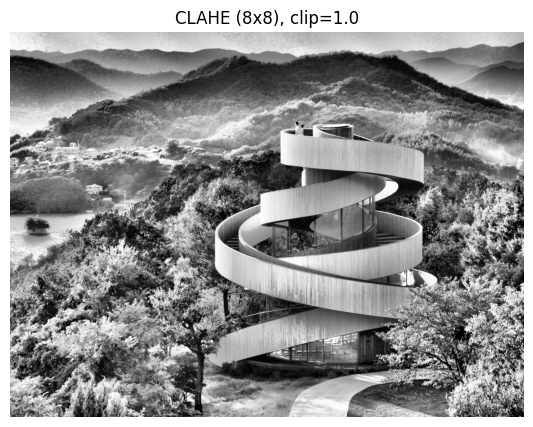

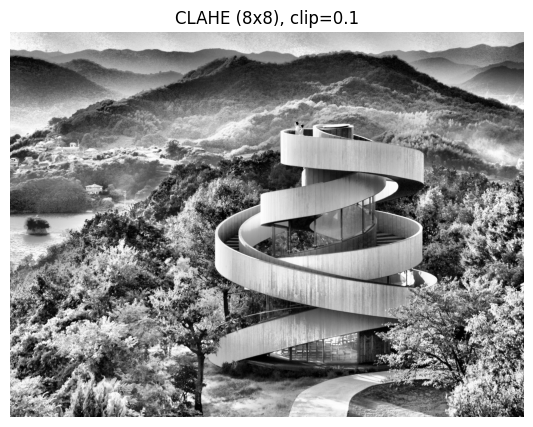

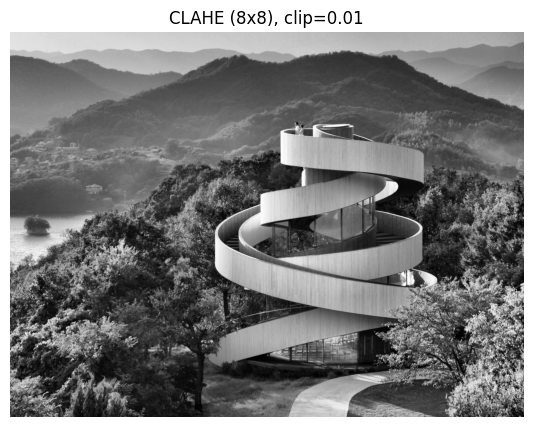

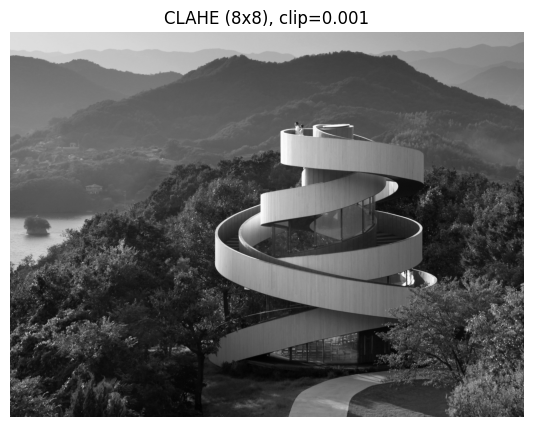

In [32]:
clips = [1.0, 0.1, 0.01, 0.001]
clahe_imgs = {}
for cl in clips:
    im = ahe_like(src, grid=(8,8), clip_limit=cl); clahe_imgs[cl] = im
    show(im, f"CLAHE (8x8), clip={cl}", cmap="gray", fname=f"60_clahe_clip_{str(cl).replace('.','_')}.png")

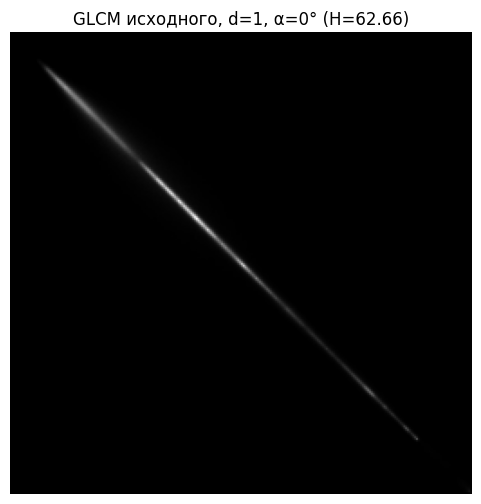

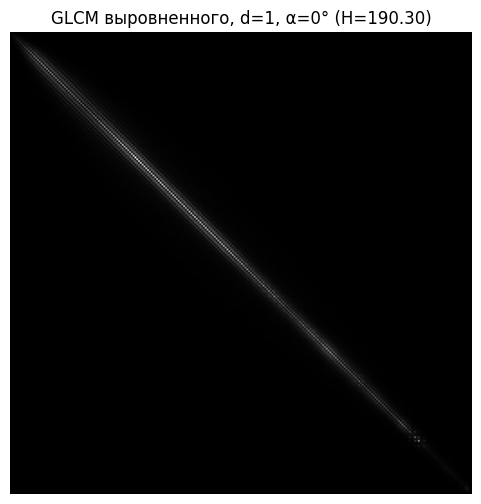

In [33]:
enh = clahe_imgs.get(0.01, src)

G_src_1_0, h_src_1_0 = glcm_contrast(gray, 1, 0)
G_src_1_90, h_src_1_90 = glcm_contrast(gray, 0, 1)
G_enh_1_0, h_enh_1_0 = glcm_contrast(enh, 1, 0)
G_enh_1_90, h_enh_1_90 = glcm_contrast(enh, 0, 1)

show(G_src_1_0, f"GLCM исходного, d=1, α=0° (H={h_src_1_0:.2f})", cmap="gray", fname="61_glcm_src_d1_a0.png", size=(6,6))
show(G_enh_1_0, f"GLCM выровненного, d=1, α=0° (H={h_enh_1_0:.2f})", cmap="gray", fname="62_glcm_enh_d1_a0.png", size=(6,6))

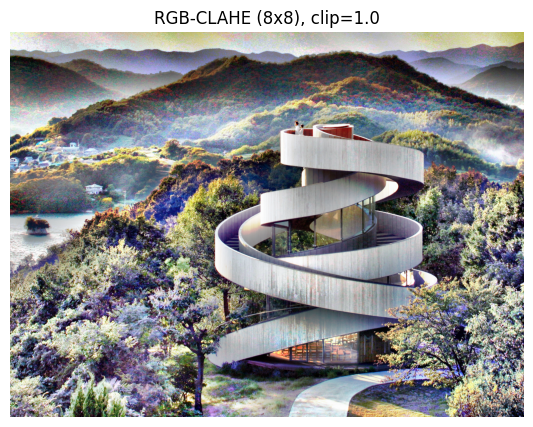

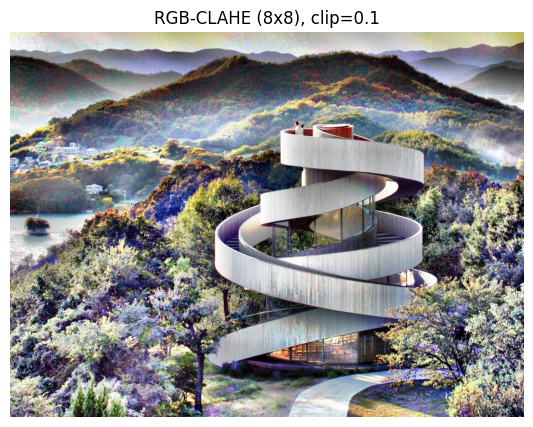

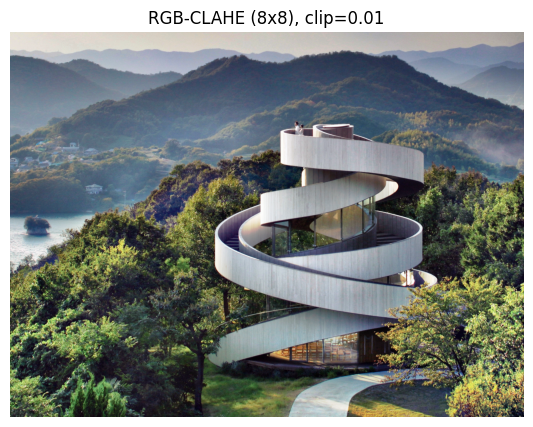

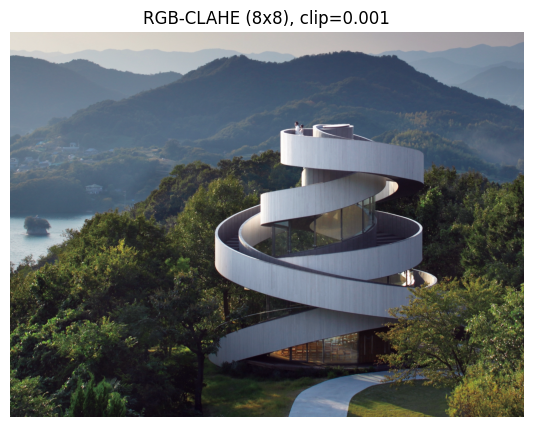

In [34]:
def clahe_rgb(img_rgb, clip=0.01):
    out = np.zeros_like(img_rgb)
    for k in range(3):
        out[...,k] = ahe_like(img_rgb[...,k], grid=(8,8), clip_limit=clip)
    return out

for cl in [1.0, 0.1, 0.01, 0.001]:
    rgb_clahe = clahe_rgb(rgb, clip=cl)
    show(rgb_clahe, f"RGB-CLAHE (8x8), clip={cl}", fname=f"70_rgb_clahe_{str(cl).replace('.','_')}.png")

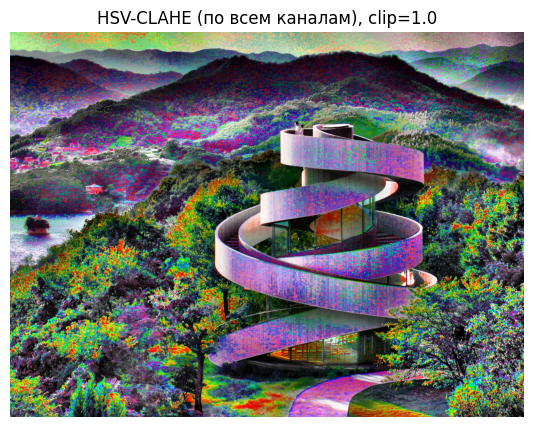

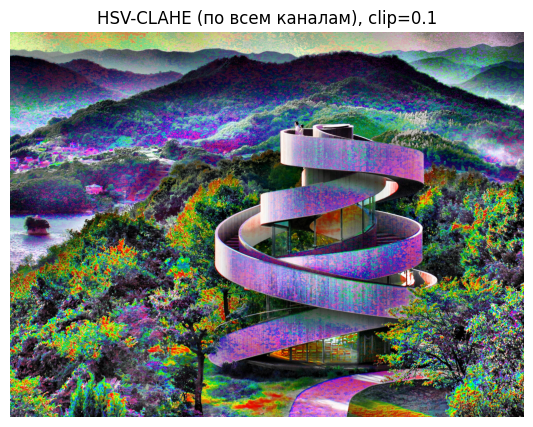

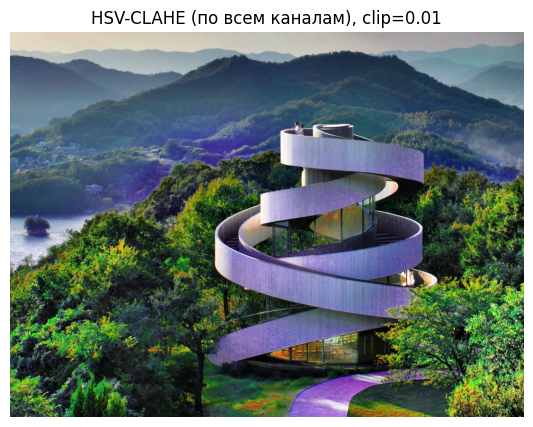

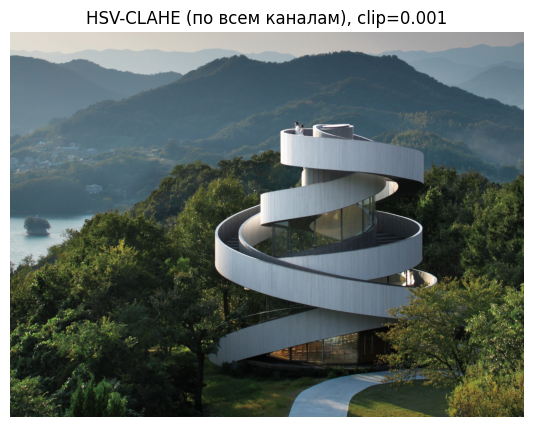

In [35]:
def clahe_hsv(img_rgb, clip=0.01):
    if SKIMAGE_OK:
        hsv = color.rgb2hsv(img_rgb/255.0)
        H = (hsv[...,0]*255).astype(np.uint8)
        S = (hsv[...,1]*255).astype(np.uint8)
        V = (hsv[...,2]*255).astype(np.uint8)
        Hc = ahe_like(H, grid=(8,8), clip_limit=clip)
        Sc = ahe_like(S, grid=(8,8), clip_limit=clip)
        Vc = ahe_like(V, grid=(8,8), clip_limit=clip)
        rgb_c = (color.hsv2rgb(np.dstack([Hc,Sc,Vc])/255.0)*255).clip(0,255).astype(np.uint8)
        return rgb_c
    # если нет skimage, приблизим RGB-CLAHE
    return clahe_rgb(img_rgb, clip)

for cl in [1.0, 0.1, 0.01, 0.001]:
    hsv_clahe = clahe_hsv(rgb, clip=cl)
    show(hsv_clahe, f"HSV-CLAHE (по всем каналам), clip={cl}", fname=f"80_hsv_clahe_{str(cl).replace('.','_')}.png")